In [1]:
include("source.jl")
include("NS_FVM_solver.jl")
using JLD
training_data_path = "data/KF/training_data.jld"

using Plots

# Navier stokes equations

In this notebook we consider the incompressible forced Navier-Stokes equations

$$ \frac{\partial \mathbf{V}}{\partial t} = - (\mathbf{V} \cdot \nabla)\mathbf{V} + \frac{1}{\text{Re}}\nabla^2\mathbf{V} -\nabla p + \mathbf{F} \\
\nabla \cdot \mathbf{V} = 0
$$

for $\mathbf{V} = \begin{bmatrix} u & v \end{bmatrix}^T$. We consider Kolmogorov Flow in 2D with periodic boundary condtions. In this case the forcing is defined as

$$ \mathbf{F} = \begin{bmatrix}{\sin(4y)} \\ 0 \end{bmatrix} - 0.1 \mathbf{V}.$$

Training data is obtained by running the generate_KF_data.jl script.

## Load training data

In [2]:
t_data, sim_data, F = (load(training_data_path)[i] for i in ("t","V","F"))
0

0

## Initialize meshes and define compression factor

In [3]:
N = size(sim_data)[1:2]
UPC = size(sim_data)[3]        


x= collect(LinRange(-pi,pi,N[1]+1))
y = collect(LinRange(-pi,pi,N[2]+1))

fine_mesh = gen_mesh(x,y,UPC = UPC)

# number of unknowns per cell

J = (32,32) # compression in each direction
coarse_mesh = gen_coarse_from_fine_mesh(fine_mesh,J)
MP = gen_mesh_pair(fine_mesh,coarse_mesh)
0



┌ Warning: Layer with Float32 parameters got Float64 input.
│   The input will be converted, but any earlier layers may be very slow.
│   layer = ConvTranspose((32, 32), 2 => 2, stride=32, bias=false)  # 4_096 parameters
│   summary(x) = "8×8×2×1 Array{Float64, 4}"
└ @ Flux ~/.julia/packages/Flux/jgpVj/src/layers/stateless.jl:60


0

## Generate the operators used to solve Navier-Stokes

In [4]:
setup = gen_setup(fine_mesh)
0

0

## Compute vorticity of the DNS and display

The voriticity $\omega$ is computed as 


$$\omega = \frac{\partial v}{\partial x} - \frac{\partial u}{\partial y} $$.

[ Info: Saved animation to /home/toby/Projects/Local_POD_NS/DNS_flow.gif


Plots.AnimatedGif("/home/toby/Projects/Local_POD_NS/DNS_flow.gif")
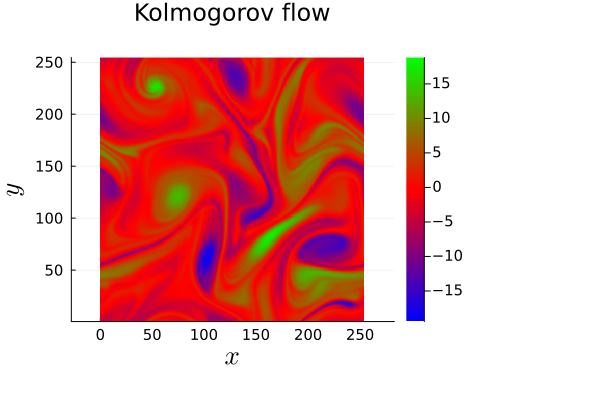

In [5]:
to_plot = setup.O.w(sim_data[:,:,:,1,1:50])[:,:,1,:]

ymin = minimum(to_plot)
ymax = maximum(to_plot)


anim = @animate for index in 1:size(to_plot)[3]
    Plots.heatmap(to_plot[:,:,index]',color = :brg,clim = (ymin,ymax),yflip=false,xtickfontsize = 10,ytickfontsize = 10
    ,aspect_ratio = :equal,titlefontsize=16,yguidefontsize=18,xguidefontsize=18,title = "Kolmogorov flow",right_margin = 35Plots.mm)
    Plots.xlabel!(L"x")
    Plots.ylabel!(L"y")
    #title!(L"t = " * string(round(example_t[index],digits = 1)))
end

gif(anim, "DNS_flow.gif", fps = 30)

## Energy trajectory of the DNS

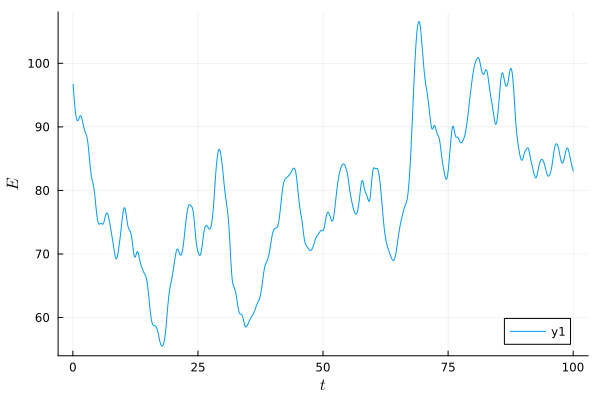

In [6]:
energies = fine_mesh.ip(sim_data,sim_data)
plot(t_data[:,:,:,1,:][1:end],energies[:,:,:,1,:][1:end])
xlabel!(L"t")
ylabel!(L"E")

# Filtering and Local POD

## Discrete solution

Let us consider a continuous solution $\mathbf{V}(\mathbf{x},t)  \in \mathbb{R}^2$:
\begin{equation}
    \mathbf{V} = \begin{bmatrix}
        u \\ v
    \end{bmatrix}
\end{equation}
to the 2D incompressible Navier-Stokes equations on the domain $\Omega$. This solution is obtained by interpolating a DNS solution using some finite-dimensional basis.

Next, we divide the domain into coarse-grid cells. These are chosen to be much larger than the grid cells used for the DNS. On each of the coarse grid-cells we define a set of orthonormal basis functions $\boldsymbol{\phi}_{ij}(\mathbf{x}) \in \mathbb{R}^2$, where $i=1,\ldots,I$ indicates the considered grid cell and $j = 1,\ldots,J$ the considered basis function. These function are only non-zero on their associated coarse grid-cell $\Omega_i$. Note that this basis must be constructed in a consistent fashion between grid cells. In addition, this basis must be sufficiently large such we can express $\mathbf{V}$ in terms of this basis
\begin{equation}
    \mathbf{V}(t,\mathbf{x}) = \sum^{IJ}_{i=1,j=1} b_{ij}(t)\boldsymbol{\phi}_{ij}(\mathbf{x}). 
\end{equation}
The coefficients $b_{ij}$ are obtained as
\begin{equation}
    b_{ij}(t) = \frac{1}{|\Omega_i|}\int_{\Omega_i} \mathbf{V}(t,\mathbf{x})\cdot \boldsymbol{\phi}_{ij}(\mathbf{x})\text{d}\Omega.
\end{equation}
The first basis functions are chosen to be
\begin{equation}
     \boldsymbol{\phi}_{i1}(\mathbf{x}) = \begin{bmatrix} 1 \\ 0 \end{bmatrix}, \quad \boldsymbol{\phi}_{i2}(\mathbf{x}) = \begin{bmatrix} 0 \\ 1 \end{bmatrix}
\end{equation}
such that $b_{i1}$ and $b_{i2}$ can be interpreted as a discrete filtered solution
\begin{equation}
    \bar{\text{u}}_i := b_{i1} = \frac{1}{|\Omega_i|} \int_{\Omega_i} u \text{d}\Omega, \quad \bar{\text{v}}_i:= b_{i2} =  \frac{1}{|\Omega_i|} \int_{\Omega_i} v \text{d}\Omega.
\end{equation}
In turn, we can make the distinction between resolved scales $\bar{\mathbf{V}}$ and SGS content $\mathbf{V}^\prime$:
\begin{equation}
    \mathbf{V}= \underbrace{\sum^{I}_{i=1} \bar{\text{u}}_i \boldsymbol{\phi}_{i1} + \bar{\text{v}}_i \boldsymbol{\phi}_{i2}}_{=:\bar{\mathbf{V}}} + \underbrace{\sum^{IJ}_{i=1, j=3} b_{ij}\boldsymbol{\phi}_{ij}}_{=:\mathbf{V}^\prime}.
\end{equation}
Due to the orthogonality of the local basis the total momentum is captured by the filtered solution
\begin{equation}
    \mathbf{P}:= \int_\Omega \mathbf{V} \text{d}\Omega = \sum^I_{i} |\Omega_i|\begin{bmatrix}
        \bar{\text{u}}_i \\ \bar{\text{v}}_i
    \end{bmatrix}.
\end{equation}
However, the total energy does contain SGS contributions
\begin{equation}
    E := \frac{1}{2}\int_\Omega \mathbf{V}\cdot \mathbf{V} \text{d}\Omega = \underbrace{\frac{1}{2}\sum_{i=1}^I |\Omega_i| (\bar{\text{u}}_i^2 + \bar{\text{v}}_i^2)}_{=: \bar{E}} + \underbrace{\frac{1}{2}\sum^{IJ}_{i=1, j=3} |\Omega_i| b_{ij}^2}_{=: E^\prime}.
\end{equation}
Depending on the flow conditions we require a large basis to capture the SGS energy. Working in such a large basis requires a lot computational resources. 

## Local POD

In order to alleviate this we construct a new basis POD basis $\boldsymbol{\psi}_{ik}(\mathbf{x}) \in \mathbb{R}^2$:
 \begin{equation}
     \boldsymbol{\psi}_{ik}(\mathbf{x}) = \sum^{IJ}_{i=1,j=1} c_{jk} \boldsymbol{\phi}_{ij}(\mathbf{x}).
 \end{equation} 
 for $k = 1,\ldots,r$ and $2 < r < J$.
For the first two basis functions we simply take the resolved flow field, i.e. $\boldsymbol{\psi}_{i1} = \boldsymbol{\phi}_{i1}$ and $\boldsymbol{\psi}_{i2} = \boldsymbol{\phi}_{i2}$.
 The remaining coefficients $c_{jk}$ are obtained using a singular value decomposition (SVD) of the snapshot matrix the SGS coefficients at different points $t_1,t_2,\ldots t_p$ in time:
\begin{equation} \mathbf{X}_b = \begin{bmatrix} b_{13}(t_1) & b_{23}(t_1) & \ldots & b_{13}(t_2) & b_{23}(t_2) & \ldots & b_{13}(t_p) & b_{23}(t_p) \\
b_{14}(t_1) & b_{24}(t_1)& \ldots & b_{14}(t_2) & b_{24}(t_2)& \ldots &  b_{14}(t_p) & b_{24}(t_p)& \\
\vdots & \vdots & \ldots & \vdots & \vdots & \ldots & \vdots & \vdots  \\ 
b_{1J}(t_1) & b_{2J}(t_1)& \ldots & b_{1J}(t_2) & b_{2J}(t_2)& \ldots & b_{1J}(t_p) & b_{2J}(t_p)
\end{bmatrix} = \mathbf{U}\boldsymbol{\Sigma}\mathbf{H}^T.
\end{equation}
The coefficients values $c_{jk}$ for $j = 3,\ldots,r$ corresponds to the first $r-2$ columns of $\mathbf{U}$.

In this new basis the solution is approximated as 
\begin{equation}
    \mathbf{V}(t,\mathbf{x}) \approx \mathbf{V}_r(t,\mathbf{x}) := \sum^{Ir}_{i=1,k=1} a_{ik}(t)\boldsymbol{\psi}_{ij}(\mathbf{x}),
\end{equation}
where the POD coefficient values $a_{ik}$ are obtained as
\begin{equation}
\begin{split}
    a_{ik}(t) = \frac{1}{|\Omega_i|}\int_{\Omega_i} \mathbf{V}(t,\mathbf{x})\cdot \boldsymbol{\psi}_{ik}(\mathbf{x})\text{d}\Omega = \frac{1}{|\Omega_i|}\int_{\Omega_i} \sum^{J}_{j=1} b_{ij}(t)\boldsymbol{\phi}_{ij}(\mathbf{x})\cdot \sum^{J}_{j=1} c_{jk} \boldsymbol{\phi}_{ij}(\mathbf{x})\text{d}\Omega  = \sum^{J}_{j=1}b_{ij}(t)c_{jk},
\end{split}
\end{equation}
due to the orthonormality of the initial basis. This new basis representation minimizes the projection error
\begin{equation}
    \sum^p_{i=1} \int_\Omega ||\mathbf{V}(\mathbf{x},t_i) -\mathbf{V}_r(\mathbf{x},t_i)||_2^2\text{d}\Omega \quad \text{subject to} \quad \mathbf{P}(t) = \int_\Omega \mathbf{V}(\mathbf{x},t) \text{d}\Omega = \int_\Omega \mathbf{V}_r(\mathbf{x},t) \text{d}\Omega.
\end{equation}
The momentum constraint is satisfied as the first two basis functions capture all the momentum: $\boldsymbol{\psi}_{i1} = \boldsymbol{\phi}_{i1}$ and $\boldsymbol{\psi}_{i2} = \boldsymbol{\phi}_{i2}$. The total energy is approximated as
\begin{equation}
    E \approx E_r := \frac{1}{2}\int_\Omega \mathbf{V}_r \cdot \mathbf{V}_r \text{d}\Omega= \underbrace{\frac{1}{2}\sum_{i=1}^I |\Omega_i| (\bar{\text{u}}_i^2 + \bar{\text{v}}_i^2)}_{= \bar{E}} + \underbrace{\frac{1}{2}\sum^{IJ}_{i=1, j=3} |\Omega_i| a_{ij}^2}_{\approx E^\prime} = \mathbf{a}^T\boldsymbol{\Omega}\mathbf{a},
\end{equation}
where $\mathbf{a}\in \mathbb{R}^{Ir}$ is the vector containing the POD coefficients and $\boldsymbol{\Omega}$ the mass matrix.


## Carry out local POD

In [7]:
original_shape = size(sim_data)[end-1:end]

data = reshape(sim_data,(size(sim_data)[1:end-2]...,original_shape[2]*original_shape[1]))

conserve_momentum = true

true

In [8]:

### momentum conserving correction of data set

number_of_snapshots = 100 ## use 500 for the SVS (otherwise I get memory issues)
random_indexes = rand(collect(1:size(data)[end]),(number_of_snapshots,))

data_hat = sqrt.(MP.omega_tilde) .* setup.GS.A_s_c(data[:,:,:,random_indexes])
reshape_for_local_SVD(data_hat,MP)

POD_modes,S = carry_out_local_SVD(data_hat,MP,subtract_average = conserve_momentum)

0
GC.gc()

In [9]:
save("POD_modes.jld","POD_modes",POD_modes,"S",S)


In [10]:
POD_modes, = (load("POD_modes.jld")[i] for i in ("POD_modes",))
#POD_modes,S = (load("POD_modes.jld")[i] for i in ("POD_modes","S"))

Base.Generator{Tuple{String}, var"#558#559"}(var"#558#559"(), ("POD_modes",))

## Singular values

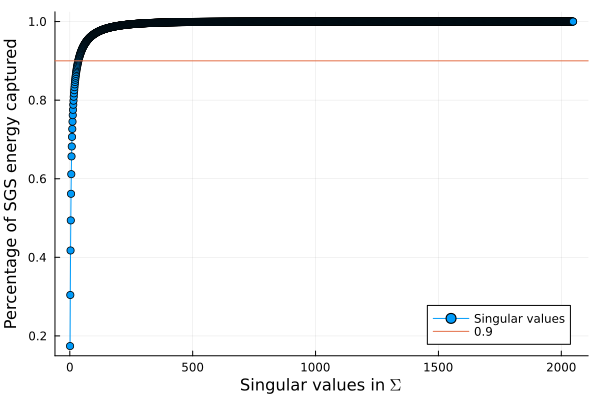

In [11]:
Plots.plot([sum(S[1:i]) for i in 1:size(S)[1]] ./ sum(S),marker = true,label = "Singular values")
hline!([0.9],label = "0.9")
xlabel!("Singular values in " * L"\Sigma")
ylabel!("Percentage of SGS energy captured")

## Some of the POD modes

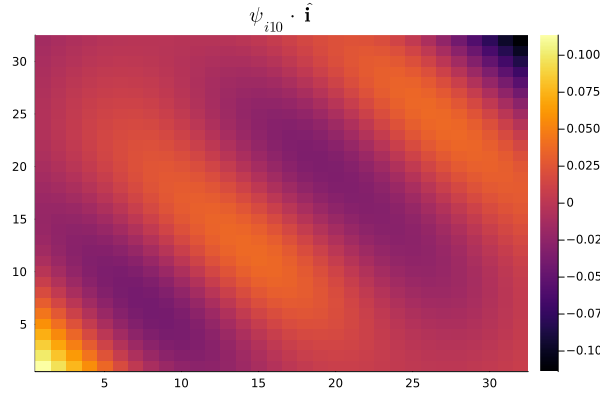

In [12]:
heatmap(POD_modes[:,:,1,20])
title!(L"\psi_{i10} \cdot \hat{\mathbf{i}}")

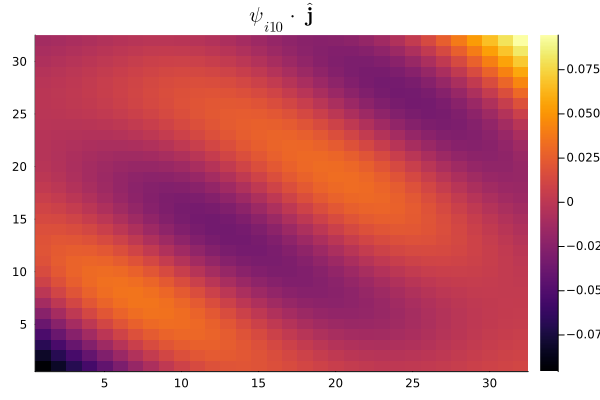

In [13]:
heatmap(POD_modes[:,:,2,20])
title!(L"\psi_{i10} \cdot \hat{\mathbf{j}}")

## Construct projection operators

In [14]:
r =50 #how many modes to include, including V_bar
uniform = true

if conserve_momentum 
    if r >= UPC + 1
        global_POD_modes = local_to_global_modes(POD_modes[[(:) for i in 1:fine_mesh.dims]...,:,1:(r-UPC)],MP)

    else
        global_POD_modes = 0
    end

    global_POD_modes = add_filter_to_modes(global_POD_modes,MP,orthogonalize = !uniform)

else
    global_POD_modes = local_to_global_modes(POD_modes[[(:) for i in 1:fine_mesh.dims]...,:,1:r],MP)
end

PO = gen_projection_operators(global_POD_modes,MP,uniform =uniform)

GC.gc()


In [15]:
function POD_linear_operator_projection(operator,PO,mesh,setup)
    N = mesh.N
    dims = mesh.dims
    r = PO.r
    
    dummy_data = zeros(N...,r,1)
    loop_over = gen_permutations([[5 for i in 1:dims]...,r]) #.-2 
   
    
    stencil = zeros([5 for i in 1:dims]...,r,r)
    
    #loop_over[:,1:fine_mesh.dims] .-= 2
    
    for i in 1:size(loop_over)[1]
        i = loop_over[i,:]
        
        test = copy(dummy_data)
        test[i...,1] += 1
        

        test = PO.W(operator(PO.R(test)))

        for j in 1:i[end]

            stencil[i...,j:j] .= test[[3 for i in 1:dims]...,j,1:1]
            
        end
        
    end
    return stencil
end
    

POD_linear_operator_projection (generic function with 1 method)

In [16]:
to_project(x) = setup.O.D(padding(x,(1,1),circular = true))

litty = POD_linear_operator_projection(to_project,PO,coarse_mesh)

LoadError: MethodError: no method matching POD_linear_operator_projection(::typeof(to_project), ::projection_operators_struct, ::mesh_struct)

[0mClosest candidates are:
[0m  POD_linear_operator_projection(::Any, ::Any, ::Any, [91m::Any[39m)
[0m[90m   @[39m [35mMain[39m [90m[4mIn[15]:1[24m[39m


In [17]:
litty[:,:,50:50,:]

LoadError: UndefVarError: `litty` not defined

In [15]:
function true_W(u,setup,setup_bar,PO)
    
    UPC = setup.mesh.UPC
    dims = setup.mesh.dims

    
    a = PO.W(setup.GS.A_s_c(u))
    
    u_bar_c = a[[(:) for i in 1:dims]...,1:UPC,:]

    u_bar_s = setup_bar.GS.A_c_s(u_bar_c)
    
    r = setup_bar.O.M(padding(u_bar_s,Tuple((1 for i in 1:dims)),circular = true))
    p = setup_bar.PS(r)
    
    Gp = setup_bar.O.G(padding(p,Tuple((1 for i in 1:dims)),circular = true))
    
    u_bar_s -= Gp
    
    return cat(u_bar_s,a[[(:) for i in 1:dims]...,UPC+1:end,:],dims = dims+1)
end

function true_R(a,setup,setup_bar,PO)
    
    UPC = setup.mesh.UPC
    dims = setup.mesh.dims
    
    u_bar_s = a[[(:) for i in 1:dims]...,1:UPC,:]
    
    u_bar_s = setup_bar.GS.A_s_c(u_bar_s)
    
    u_r = setup.GS.A_c_s(PO.R(cat(u_bar_s,a[[(:) for i in 1:dims]...,UPC+1:end,:],dims = dims+1)))
    
    r = setup.O.M(padding(u_r,Tuple((1 for i in 1:dims)),circular = true))
    p = setup.PS(r)

    Gp = setup.O.G(padding(p,Tuple((1 for i in 1:dims)),circular = true))
    
    u_r -= Gp
    
    
    return u_r
end





true_R (generic function with 1 method)

## Project reference data onto POD space

In [16]:
GC.gc()

setup_bar = gen_setup(coarse_mesh)

W(u,setup = setup,setup_bar = setup_bar,PO = PO) = true_W(u,setup,setup_bar,PO)
R(a,setup = setup,setup_bar = setup_bar,PO = PO) = true_R(a,setup,setup_bar,PO)

ref_data = W(data)
data = 0

F_a = W(F)
rhs_bar = gen_rhs(setup_bar,F_a[:,:,1:2,:];Re = 1000)
0

0

## Plot vorticity of reconstructed $\mathbf{u}_r$

[ Info: Saved animation to /home/toby/Projects/Local_POD_NS/DNS_flow.gif


Plots.AnimatedGif("/home/toby/Projects/Local_POD_NS/DNS_flow.gif")
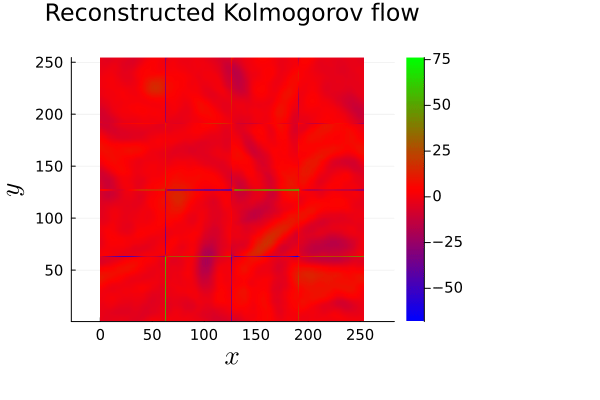

In [17]:
to_plot = setup.O.w(R(ref_data[:,:,:,1:50]))[:,:,1,:]

ymin = minimum(to_plot)
ymax = maximum(to_plot)


anim = @animate for index in 1:size(to_plot)[3]
    Plots.heatmap(to_plot[:,:,index]',color = :brg,clim = (ymin,ymax),yflip=false,xtickfontsize = 10,ytickfontsize = 10
    ,aspect_ratio = :equal,titlefontsize=16,yguidefontsize=18,xguidefontsize=18,title = "Reconstructed Kolmogorov flow",right_margin = 35Plots.mm)
    Plots.xlabel!(L"x")
    Plots.ylabel!(L"y")
    #title!(L"t = " * string(round(example_t[index],digits = 1)))
end
to_plot = 0
gif(anim, "DNS_flow.gif", fps = 30)


# Evolution of the state

We are interested in marching the coefficients $\mathbf{a}$ forward in time:

$$ \frac{\text{d}\mathbf{a}}{\text{d}t} = ????? $$.

One option would be to do a Galerkin projection, however this scales cubically due to the presence of the non-linear term in the Navier-Stokes equations. Also it would be difficult to deal with the algebraic constraint. It is therefore we propose to use our structure-preserving closure modeling framework introduced in https://arxiv.org/abs/2301.13770. This works as follows:

We first obtain $\mathbf{a}\in \mathbb{R}^{rI}$ from a discrete DNS $\mathbf{V}_h \in \mathbb{R}^{2N}$:

$$ \mathbf{a} = \begin{bmatrix} \bar{\mathbf{V}}_h \\ \text{SGS modes}  \end{bmatrix}=  \mathbf{P} \mathbf{A}_{c}^s \mathbf{T}\mathbf{V}_h$$,

where $\mathbf{T}$ is the discretized local POD projection. The first two modes of each coarse grid cell will be referred as $\bar{\mathbf{V}}_h \in \mathbb{R}^{2I}$ which correspond to the averaged velocity in each direction. We use a staggered grid finite volume implementation for our coarse grid model. We therefore project $\bar{\mathbf{V}}$ onto this staggered grid using the operator $\mathbf{A}_{c}^s \in \mathbb{R}^{rI \times rI}$. In addition we project onto a divergence free basis using the operator $\mathbf{P} \in \mathbb{R}^{rI \times rI}$. Note that these final two operator do not affect the SGS modes of $\mathbf{a}$ but only $\bar{\mathbf{V}}$. The evolution equation is modeled as follows:

$$\frac{\text{d}\mathbf{a}}{\text{d}t} \approx \begin{bmatrix} -\mathbf{C}(\bar{\mathbf{V}}_h)\bar{\mathbf{V}}_h+\frac{1}{\text{Re}}\mathbf{D}\bar{\mathbf{V}}_h - \mathbf{G}\bar{\mathbf{p}}_h\\ \mathbf{0} \end{bmatrix} +\mathbf{A}_{c}^s \text{SP}(\mathbf{A}_{s}^c \mathbf{a}) + \mathbf{P} \mathbf{A}_{c}^s \mathbf{T} \mathbf{F}, \\ 
\mathbf{M}\bar{\mathbf{V}}_h= 0,$$

where $\mathbf{A}_{s}^c$ projects $\bar{\mathbf{V}}_h$ onto a cell-centred grid such that it plays nicely with the convolutional neural network contained in our structure-preserving closure $\text{SP}$. For $\bar{\mathbf{V}}_h$ we also include the coarse discretization. In the absence of forcing this model is strictly dissipative:

$$ \frac{1}{2} \frac{\text{d}\mathbf{a}^T\boldsymbol{\Omega}\mathbf{a}}{\text{d}t} = \mathbf{a}^T\boldsymbol{\Omega}\frac{\text{d}\mathbf{a}}{\text{d}t} = \leq  0.$$

## Define neural network and full framework including phyiscs

In [27]:
kernel_sizes= [(1,1),(1,1)]
channels = [r+2,50] # r+2 as the first channels are the coarse rhs
strides = [(1,1),(1,1)]
B = (1,1)
boundary_padding = "c" #[["c","c"];;[0,0]]


constrain_energy =true # whether to use a physics constrained NN or not
dissipation = true # include dissipation if physics is constrained
conserve_momentum =true # conserve momentum if physics is constrained


model = gen_skew_NN(kernel_sizes,channels,strides,r,B,boundary_padding = boundary_padding,UPC = coarse_mesh.UPC,constrain_energy = constrain_energy,dissipation = dissipation,conserve_momentum = conserve_momentum)
0

0

In [28]:
function neural_rhs(a,mesh,t,rhs = rhs_bar,setup = setup_bar,model = model,F = F_a,B=B,damping = 0.1;other_arguments = 0)
    
    dims = mesh.dims
    
    u_s = a[:,:,1:2,:]
    
    RHS = rhs(u_s,mesh,t,solve_pressure = false)
    
    RHS_c = setup.GS.A_s_c(RHS)
    u_c = setup.GS.A_s_c(u_s)
    
    a_c = cat(u_c,a[:,:,3:end,:],dims = dims+1)
    
    input = cat(RHS_c,a,dims = dims +1)  

    nn_output = model.eval(input,a = padding(a_c,2 .* B,circular = true))
    
    nn_output = cat(setup.GS.A_c_s(nn_output[:,:,1:2,:]),nn_output[:,:,3:end,:],dims = dims+1)
    
    ### find pressure based on NN_output

    r = setup.O.M(padding(RHS + nn_output[:,:,1:2,:] ,(1,1),circular = true))
    
    p = setup.PS(r)
    
    Gp = setup.O.G(padding(p,(1,1),circular = true))
     
    ####################################
    # include damping from kolmogorov flow
    physics_rhs = cat( RHS -Gp , - damping * a[:,:,3:end,:] .+ F[:,:,3:end,:] ,dims = dims +1) 

    return nn_output +   physics_rhs
    
    
end

neural_rhs (generic function with 7 methods)

## Preprate trajectory fitting

In [20]:
# remove data that lies at the end of the simulation
traj_dt = 0.025
traj_steps = 1

buffer_dt = traj_steps * traj_dt 



simulation_indexes = collect(1:original_shape[end-1])'
simulation_indexes = cat([simulation_indexes for i in 1:original_shape[end]]...,dims = fine_mesh.dims + 2)
simulation_indexes = simulation_indexes[1:end]
simulation_times = t_data[1:end]

ref_data_trajectory = reshape(ref_data,(size(ref_data)[1:coarse_mesh.dims+1]...,original_shape...))
        
#### such that we can interpolate between our snapshots
sim_interpolator = gen_time_interpolator(t_data,ref_data_trajectory)

select = buffer_dt .< maximum(simulation_times) .- simulation_times

traj_data = ref_data[[(:) for i in 1:coarse_mesh.dims+1]...,select]
traj_indexes = simulation_indexes[select]
traj_times = simulation_times[select]


function trajectory_fitting_loss(input,indexes,times,dt = traj_dt,steps = traj_steps,sim_interpolator = sim_interpolator,neural_rhs = neural_rhs,coarse_mesh = coarse_mesh)
    dims = length(size(input)) - 2
    
    t_start = reshape(times,([1 for i in 1:dims+1]...,size(times)[1]))
    t_end =  t_start .+ steps *dt
    t,result = simulate(input,coarse_mesh,dt,t_start,t_end,neural_rhs,time_step,save_every = 1,pre_allocate = false) 
    reference = stop_gradient() do
        sim_interpolator(t,simulation_indexes = indexes)
    end
    return Flux.Losses.mse(result,reference)
end    
    


trajectory_fitting_loss (generic function with 6 methods)

## Evaluate loss for some the snapshots

In [21]:
snapshots_included = 50
select = rand(collect(1:prod(size(traj_indexes))),(snapshots_included))
sqrt.(trajectory_fitting_loss(traj_data[:,:,:,select],traj_indexes[select],traj_times[select]))


0.00725000348378266

# Train model using trajectory fitting

In [34]:
opt = ADAM()

Adam(0.001, (0.9, 0.999), 1.0e-8, IdDict{Any, Any}())

In [35]:
ps = Flux.params(model.CNN,model.B_mats...)
epochs =10
losses = zeros(epochs)

batchsize = 10

for epoch in tqdm(1:epochs)
    
    ###### Load a subset of the data ######
    select = rand(collect(1:prod(size(traj_indexes))),(snapshots_included))
    trajectory_fitting_data_loader = Flux.Data.DataLoader((traj_data[:,:,:,select],traj_indexes[select],traj_times[select]), batchsize=batchsize,shuffle=true)
    #######################################
    
    Flux.train!(trajectory_fitting_loss,ps, trajectory_fitting_data_loader, opt)
    train_loss = trajectory_fitting_loss(traj_data[:,:,:,select],traj_indexes[select],traj_times[select])
    losses[epoch] = train_loss
    GC.gc()
end

0.0%┣                                               ┫ 0/10 [00:00<00:00, -0s/it]
10.0%┣████▏                                     ┫ 1/10 [01:50<Inf:Inf, InfGs/it]
20.0%┣█████████                                    ┫ 2/10 [01:52<14:57, 112s/it]
30.0%┣█████████████▉                                ┫ 3/10 [01:54<06:39, 57s/it]
40.0%┣██████████████████▍                           ┫ 4/10 [01:56<03:52, 39s/it]
50.0%┣███████████████████████                       ┫ 5/10 [01:58<02:27, 29s/it]
60.0%┣███████████████████████████▋                  ┫ 6/10 [02:00<01:36, 24s/it]
70.0%┣████████████████████████████████▏             ┫ 7/10 [02:02<01:01, 20s/it]
80.0%┣████████████████████████████████████▉         ┫ 8/10 [02:04<00:35, 18s/it]
90.0%┣█████████████████████████████████████████▍    ┫ 9/10 [02:06<00:16, 16s/it]
100.0%┣████████████████████████████████████████████┫ 10/10 [02:07<00:00, 14s/it]
100.0%┣████████████████████████████████████████████┫ 10/10 [02:07<00:00, 14s/it]


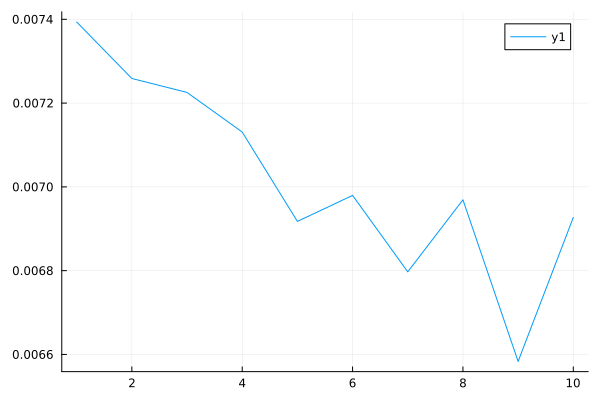

In [36]:
plot(sqrt.(losses))

In [50]:
include("source.jl")

load_skew_model (generic function with 1 method)

In [51]:
POD_modes

16×16×2×512 Array{Float64, 4}:
[:, :, 1, 1] =
 -0.0816238  -0.0724551  -0.0625386  …  0.0643347  0.0741457  0.0831963
 -0.0830339  -0.0737543  -0.0637032     0.0652956  0.0752479  0.0844165
 -0.0843063  -0.0749317  -0.0647629     0.0661351  0.076211   0.0854834
 -0.0854234  -0.0759696  -0.0657011     0.0668378  0.0770193  0.0863813
 -0.0863673  -0.0768508  -0.0665021     0.0673896  0.0776591  0.0870969
 -0.087121   -0.0775596  -0.0671524  …  0.0677794  0.0781202  0.0876195
 -0.0876703  -0.0780833  -0.0676406     0.0680008  0.0783953  0.0879407
 -0.088007   -0.0784137  -0.0679588     0.0680508  0.0784782  0.0880526
 -0.0881277  -0.0785463  -0.0681021     0.0679272  0.0783642  0.0879499
 -0.0880325  -0.0784797  -0.0680677     0.0676298  0.0780527  0.0876316
 -0.0877247  -0.0782158  -0.0678564  …  0.0671618  0.0775481  0.0871013
 -0.0872111  -0.0777607  -0.0674727     0.0665299  0.076858   0.0863669
 -0.0865012  -0.0771235  -0.0669239     0.0657437  0.0759937  0.0854403
 -0.0856072  -0.07

# Save model

In [52]:
save_skew_model(model,"first_model")


Model saved at directory [first_model]


In [19]:
model = load_skew_model("first_model")


Model loaded from directory [first_model]


skew_model_struct(var"#NN#436"{String, Bool, Bool, Bool, Int64, Tuple{Int64, Int64}, var"#NN#430#437", Vector{Array{Float32, 4}}, Chain{Tuple{Conv{2, 2, typeof(relu), Array{Float32, 4}, Vector{Float32}}, Conv{2, 2, typeof(identity), Array{Float32, 4}, Vector{Float32}}}}}(Core.Box(2), "c", true, true, true, 30, (1, 1), var"#NN#430#437"(Core.Box([-0.03850395 0.04355155 -0.0611497; 0.078250006 0.05589231 -0.08962577; -0.063014746 0.09937334 0.04165132;;; -0.05016539 -0.06248255 0.035141323; -0.046867944 -0.07665063 0.018610535; 0.004784238 0.07857932 0.01866218;;; -0.100161314 -0.073697396 0.086781; -0.04757468 0.034231313 0.061638534; -0.08667652 -0.022730736 0.070632204;;; … ;;; -0.10151037 0.07004469 0.05857868; -0.08317018 -0.048023555 -0.046092123; -0.0794786 0.0053754826 -0.10294974;;; 0.09408146 -0.07814885 0.05497168; -0.05034077 0.056850713 -0.09897046; 0.08741455 0.053335052 -0.035148412;;; -0.08164847 0.05497887 -0.02492615; 0.01814535 -0.089695945 0.08103937; 0.051988933 -0.03

## Run simulation to test

In [37]:
t_start = 0
t_end = 10
dt = 0.025
save_every = 2
pre_allocate = true
init_cond = ref_data[:,:,:,1:1]

t,pred_sim = simulate(init_cond,coarse_mesh,dt,t_start,t_end,neural_rhs,time_step,save_every = save_every,pre_allocate = pre_allocate) 
t_pred = t[1:end]
pred_sim = pred_sim[:,:,:,1,:]



0.0%┣                                              ┫ 0/400 [00:00<00:00, -0s/it]
0.8%┣▍                                             ┫ 3/400 [00:00<00:10, 38it/s]
1.5%┣▊                                             ┫ 6/400 [00:00<00:08, 48it/s]
2.5%┣█▏                                           ┫ 10/400 [00:00<00:07, 55it/s]
3.8%┣█▊                                           ┫ 15/400 [00:00<00:06, 62it/s]
4.8%┣██▏                                          ┫ 19/400 [00:00<00:06, 61it/s]
6.0%┣██▊                                          ┫ 24/400 [00:00<00:06, 66it/s]
7.2%┣███▎                                         ┫ 29/400 [00:00<00:05, 68it/s]
8.5%┣███▉                                         ┫ 34/400 [00:00<00:05, 70it/s]
9.2%┣████▏                                        ┫ 37/400 [00:01<00:05, 67it/s]
10.2%┣████▌                                       ┫ 41/400 [00:01<00:05, 68it/s]
11.2%┣█████                                       ┫ 45/400 [00:01<00:05, 69it/s]
12.2%┣█████▍                

4×4×50×200 Array{Float64, 4}:
[:, :, 1, 1] =
 -0.128869  0.486341   0.0337846  -0.391257
 -0.102758  0.83181   -0.0975842  -0.631468
 -0.243053  0.393476   0.112566   -0.26299
 -0.356252  0.416432   0.331023   -0.391204

[:, :, 2, 1] =
 -0.0539423  -0.080053  -0.425522  -0.294153
  0.384193    0.524488   0.962821   0.752671
 -1.10834    -0.995139  -1.01809   -1.23655
  0.778087    0.550704   0.480795   0.778033

[:, :, 3, 1] =
  0.0173104  0.0373613  -0.503531   -0.600072
  0.584511   0.185778    0.177131   -0.25681
 -0.600967   0.210836   -0.0515549  -0.113791
 -1.35569    0.860242   -1.0252      0.586887

;;; … 

[:, :, 48, 1] =
 -0.0073324   -0.0192756  -0.0150436    -0.00252478
 -0.00465128   0.01312    -0.0156761    -0.0177555
 -0.0124777    0.0274924   0.0132551    -0.00393678
  0.0189391    0.085161   -0.000191549  -0.00387668

[:, :, 49, 1] =
 -0.00978884  -0.0319471   -0.0344396     0.0138053
 -0.00410542  -0.0245248   -0.000436752  -0.00794849
  0.0226382   -0.0269611   -0.01

## Neural network prediction

[ Info: Saved animation to /home/toby/Projects/Local_POD_NS/NN_flow_1.gif


Plots.AnimatedGif("/home/toby/Projects/Local_POD_NS/NN_flow_1.gif")
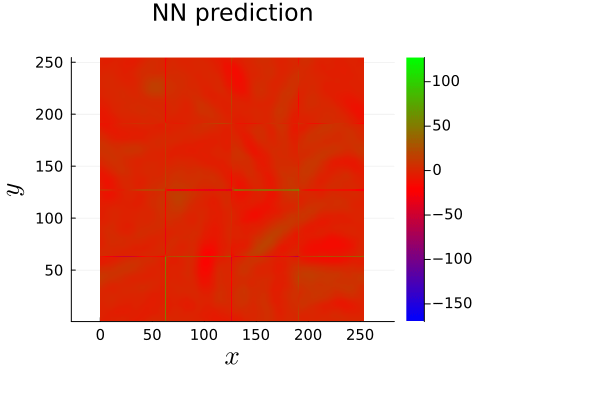

In [38]:
to_plot = setup.O.w(R(pred_sim[:,:,:,1:50]))[:,:,1,:]
#to_plot = setup_bar.O.w(pred_sim[:,:,1:2,:])[:,:,1,:]


ymin = minimum(to_plot)
ymax = maximum(to_plot)


anim = @animate for index in 1:size(to_plot)[3]
    Plots.heatmap(to_plot[:,:,index]',color = :brg,clim = (ymin,ymax),yflip=false,xtickfontsize = 10,ytickfontsize = 10
    ,aspect_ratio = :equal,titlefontsize=16,yguidefontsize=18,xguidefontsize=18,title = "NN prediction",right_margin = 35Plots.mm)
    Plots.xlabel!(L"x")
    Plots.ylabel!(L"y")
    #title!(L"t = " * string(round(example_t[index],digits = 1)))
end

gif(anim, "NN_flow_1.gif", fps = 30)

[ Info: Saved animation to /home/toby/Projects/Local_POD_NS/NN_flow_2.gif


Plots.AnimatedGif("/home/toby/Projects/Local_POD_NS/NN_flow_2.gif")
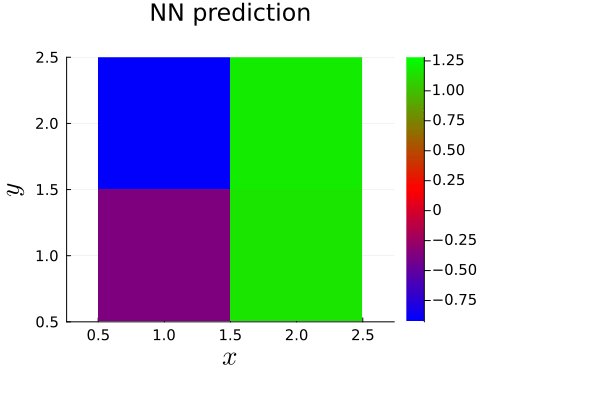

In [31]:
to_plot = setup_bar.O.w(pred_sim[:,:,1:2,1:50])[:,:,1,:]
#to_plot = setup_bar.O.w(pred_sim[:,:,1:2,:])[:,:,1,:]


ymin = minimum(to_plot)
ymax = maximum(to_plot)


anim = @animate for index in 1:size(to_plot)[3]
    Plots.heatmap(to_plot[:,:,index]',color = :brg,clim = (ymin,ymax),yflip=false,xtickfontsize = 10,ytickfontsize = 10
    ,aspect_ratio = :equal,titlefontsize=16,yguidefontsize=18,xguidefontsize=18,title = "NN prediction",right_margin = 35Plots.mm)
    Plots.xlabel!(L"x")
    Plots.ylabel!(L"y")
    #title!(L"t = " * string(round(example_t[index],digits = 1)))
end

gif(anim, "NN_flow_2.gif", fps = 30)

## Compare to ground truth

[ Info: Saved animation to /home/toby/Projects/Local_POD_NS/DNS_flow.gif


Plots.AnimatedGif("/home/toby/Projects/Local_POD_NS/DNS_flow.gif")
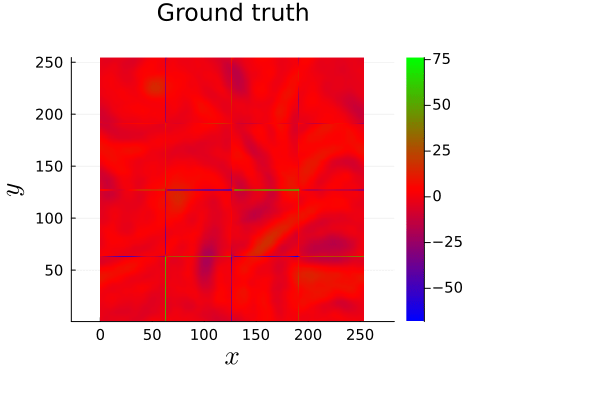

In [32]:
to_plot = setup.O.w(R(ref_data_trajectory[:,:,:,1,1:50]))[:,:,1,:]
#to_plot = setup_bar.O.w(pred_sim[:,:,1:2,:])[:,:,1,:]


ymin = minimum(to_plot)
ymax = maximum(to_plot)


anim = @animate for index in 1:size(to_plot)[3]
    Plots.heatmap(to_plot[:,:,index]',color = :brg,clim = (ymin,ymax),yflip=false,xtickfontsize = 10,ytickfontsize = 10
    ,aspect_ratio = :equal,titlefontsize=16,yguidefontsize=18,xguidefontsize=18,title = "Ground truth",right_margin = 35Plots.mm)
    Plots.xlabel!(L"x")
    Plots.ylabel!(L"y")
    #title!(L"t = " * string(round(example_t[index],digits = 1)))
end

gif(anim, "DNS_flow.gif", fps = 30)

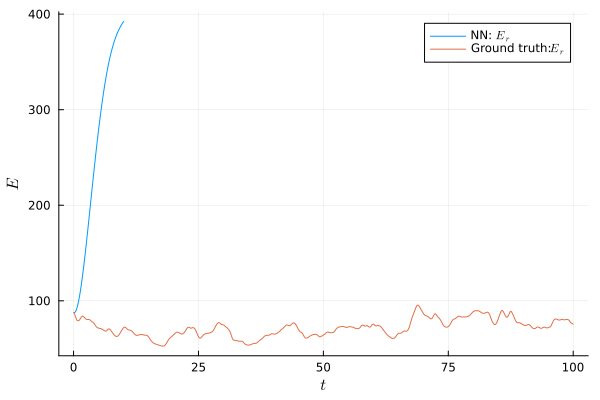

In [33]:
plot(t_pred,coarse_mesh.ip(pred_sim,pred_sim)[1:end],label = "NN: " * L"E_r")
plot!(t_data[1:end],coarse_mesh.ip(ref_data_trajectory[:,:,:,1,:],ref_data_trajectory[:,:,:,1,:])[1:end],label = "Ground truth:" * L"E_r")
#plot!(t_data[1:end],energies[:,:,:,1,:][1:end],label = L"E")
ylabel!(L"E")
xlabel!(L"t")